In [1]:
!nvidia-smi

Tue Jan 18 09:48:01 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.46       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8    11W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!pip install datasets transformers==4.6.0

     |████████████████████████████████| 306 kB 4.9 MB/s 
     |████████████████████████████████| 2.3 MB 72.8 MB/s 
     |████████████████████████████████| 895 kB 63.6 MB/s 
     |████████████████████████████████| 3.3 MB 54.2 MB/s 
     |████████████████████████████████| 243 kB 78.0 MB/s 
     |████████████████████████████████| 1.1 MB 70.0 MB/s 
     |████████████████████████████████| 133 kB 81.7 MB/s 
     |████████████████████████████████| 298 kB 68.8 MB/s 
     |████████████████████████████████| 298 kB 64.1 MB/s 
     |████████████████████████████████| 290 kB 58.6 MB/s 
     |████████████████████████████████| 290 kB 77.2 MB/s 
     |████████████████████████████████| 290 kB 54.0 MB/s 
     |████████████████████████████████| 287 kB 77.6 MB/s 
     |████████████████████████████████| 287 kB 78.8 MB/s 
     |████████████████████████████████| 287 kB 76.2 MB/s 
     |████████████████████████████████| 285 kB 79.6 MB/s 
     |████████████████████████████████| 270 kB 70.4 MB/s 
     |█████████

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import pandas as pd
import numpy as np
import pickle

In [5]:
df=pd.read_csv('/content/drive/MyDrive/ML Notebooks/IMDB/Released between 2020-01-01 and 2020-12-31 (Sorted by Number of Votes Descending).csv')
df

,Unnamed: 0,Movie name,IMDB Rating,Description,Votes,Metascore,Total Duration (in Minutes)
0,0,Tenet,7.4,"Armed with only one word, Tenet, and fighting ...",447164.0,69.0,150.0
1,1,The Queen's Gambit,8.6,"Orphaned at the tender age of nine, prodigious...",380817.0,NaN,395.0
2,2,Soul,8.1,"After landing the gig of a lifetime, a New Yor...",294048.0,83.0,100.0
3,3,Wonder Woman 1984,5.4,Diana must contend with a work colleague and b...,244864.0,NaN,151.0
4,4,Birds of Prey: And the Fantabulous Emancipatio...,6.1,"After splitting with the Joker, Harley Quinn j...",219534.0,NaN,109.0
...,...,...,...,...,...,...,...
9995,9995,Josiah,8.9,Josiah is a story of a young man who falls int...,124.0,NaN,95.0
9996,9996,Lenox Hill,8.3,"Two neurosurgeons, an ER doctor and an OB-GYN ...",124.0,NaN,NaN
9997,9997,50 States of Fright,6.3,Miami police respond to an odd call about a st...,124.0,NaN,5.0
9998,9998,Apodrasi apo ton Efthrafsto Planiti,7.0,"A boy-meets-boy tale, a few hours before the w...",124.0,NaN,17.0


In [6]:
X=list(df['Description'])
df['IMDB Rating']=df['IMDB Rating'].map(lambda x:float(x))

In [7]:
pd.Series([len(text) for text in X]).describe()

count    10000.00000
mean       161.28310
std         54.30784
min         10.00000
25%        127.00000
50%        155.00000
75%        216.00000
max        369.00000
dtype: float64

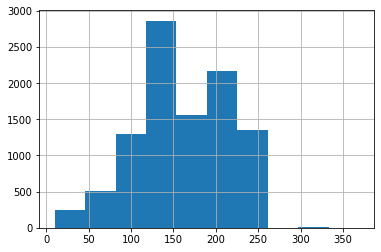

In [8]:
pd.Series([len(text) for text in X]).hist()

In [9]:
y=list((df['IMDB Rating']>8).astype('int8'))

In [10]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.1,random_state=42)

In [11]:
from transformers import DistilBertTokenizerFast
tokenizer = DistilBertTokenizerFast.from_pretrained('distilbert-base-uncased')

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

In [12]:
train_encodings = tokenizer(X_train, truncation=True, padding=True)
test_encodings = tokenizer(X_test, truncation=True, padding=True)
train_encodings

{'input_ids': [[101, 9761, 7861, 8237, 8180, 8583, 2370, 2096, 2006, 1037, 3260, 1999, 7379, 1012, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 3297, 10768, 4179, 19557, 8525, 8525, 7534, 2023, 11951, 7401, 1997, 8870, 1010, 27696, 2037, 10418, 1998, 10424, 20573, 10458, 5312, 2007, 1037, 3074, 1997, 2188, 6876, 1012, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 2155, 2372, 24665, 23804, 2007, 1996, 4458, 1997, 2037, 24211, 2269, 1998, 1996, 11270, 1997, 1996, 2166, 2002, 2419, 2076, 2010, 6438, 1012, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 1045, 9759, 5283, 1010, 22505, 2099, 2132, 1010, 1998, 

In [13]:
tokenizer(X_train, truncation=True, padding=True)

{'input_ids': [[101, 9761, 7861, 8237, 8180, 8583, 2370, 2096, 2006, 1037, 3260, 1999, 7379, 1012, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 3297, 10768, 4179, 19557, 8525, 8525, 7534, 2023, 11951, 7401, 1997, 8870, 1010, 27696, 2037, 10418, 1998, 10424, 20573, 10458, 5312, 2007, 1037, 3074, 1997, 2188, 6876, 1012, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 2155, 2372, 24665, 23804, 2007, 1996, 4458, 1997, 2037, 24211, 2269, 1998, 1996, 11270, 1997, 1996, 2166, 2002, 2419, 2076, 2010, 6438, 1012, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 1045, 9759, 5283, 1010, 22505, 2099, 2132, 1010, 1998, 

In [14]:
import tensorflow as tf

train_dataset = tf.data.Dataset.from_tensor_slices((
    dict(train_encodings),
    y_train
))

test_dataset = tf.data.Dataset.from_tensor_slices((
    dict(test_encodings),
    y_test
))

In [15]:
from datasets import load_metric

metric = load_metric("accuracy")

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    return metric.compute(predictions=predictions, references=labels)

Downloading:   0%|          | 0.00/1.42k [00:00<?, ?B/s]

In [17]:
from transformers import TFDistilBertForSequenceClassification, TFTrainer, TFTrainingArguments

training_args = TFTrainingArguments(
    output_dir='/content/drive/MyDrive/ML Notebooks/IMDB/results',
    num_train_epochs=10,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=16,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='/content/drive/MyDrive/ML Notebooks/IMDB/logs',
    logging_steps=10,
    evaluation_strategy='epoch'
)

In [18]:
with training_args.strategy.scope():
    model = TFDistilBertForSequenceClassification.from_pretrained("distilbert-base-uncased")

trainer = TFTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    compute_metrics=compute_metrics
)

trainer.train()

Downloading:   0%|          | 0.00/483 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/363M [00:00<?, ?B/s]

Some layers from the model checkpoint at distilbert-base-uncased were not used when initializing TFDistilBertForSequenceClassification: ['vocab_transform', 'vocab_projector', 'vocab_layer_norm', 'activation_13']
- This IS expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFDistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['dropout_19', 'classifier', 'pre_classifier']
You should probably TRAIN this model on a down-stream task to be able to use i

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module, class, method, function, traceback, frame, or code object was expected, got cython_function_or_method
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module, class, method, function, traceback, frame, or code object was expected, got cython_function_or_method
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: while/else statement not yet supported
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Cause: while/else statement not yet supported
To silence this warning, decorate the function with @tf.autograph.experi

In [25]:
history=trainer.evaluate(test_dataset)
print(history)
accuracy=history['eval_accuracy']
loss=history['eval_loss']

{'eval_loss': 1.0704966953822546, 'eval_accuracy': 0.8134920634920635}


In [28]:
trainer.predict(test_dataset)

PredictionOutput(predictions=array([[ 1.85636  , -1.8405489],
       [ 4.1233907, -4.3728485],
       [ 4.030346 , -4.2610135],
       ...,
       [-1.9202596,  1.9376054],
       [ 3.8858898, -4.0303802],
       [ 2.778618 , -2.8778336]], dtype=float32), label_ids=array([0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
    

In [29]:
from sklearn.metrics import classification_report,confusion_matrix,roc_auc_score
output = trainer.predict(test_dataset)[0]
output = np.argmax(output, axis = - 1)
print(confusion_matrix(y_test,output))

[[678  67]
 [119 136]]


In [30]:
print(classification_report(y_test,output))

              precision    recall  f1-score   support

           0       0.85      0.91      0.88       745
           1       0.67      0.53      0.59       255

    accuracy                           0.81      1000
   macro avg       0.76      0.72      0.74      1000
weighted avg       0.80      0.81      0.81      1000



In [38]:
history['ROC_AUC_SCORE']=roc_auc_score(y_test,output)
history['ROC_AUC_SCORE']

0.7217002237136464

In [32]:
trainer.save_model('/content/drive/MyDrive/ML Notebooks/IMDB/Movie_prediction_model')

In [42]:
with open('/content/drive/MyDrive/ML Notebooks/IMDB/model_metrics','wb') as file:
    pickle.dump(history,file)
    file.close()